# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import time
import random

import ta

from statsmodels.tsa.stattools import acf, pacf, adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose



%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set_style('whitegrid')

## Functions

In [2]:
# Function to test ADF Test
def adf_test(df, columns):
    for col in columns: # Loop for each Company
        result = adfuller(df[col].values, autolag='AIC') # ADF Test
        print(f'ADF Statistic for {col}: {result[0]}')
        print(f'p-value for {col}: {result[1]}')
        for key, value in result[4].items():
            print('Critial Values:')
            print(f'   {key}, {value}')
        if result[1] > 0.05:
            print(f'P-Value is more than 0.05, Null Hypothesis cannot be Rejected. Hence, {col} is not Stationary.')
        else:
            print(f'P-Value is less than 0.05, Null Hypothesis is Rejected. {col} is Stationary.')
        print('-'*40) # print ------ to seperate each loop

In [3]:
# Function to test KPSS Test
def kpss_test(df, columns):
    for col in columns: # Loop for each Company
        result = kpss(df[col].values, regression='c') # ADF Test
        print(f'KPSS Statistic for {col}: {result[0]}')
        print(f'p-value for {col}: {result[1]}')
        for key, value in result[3].items():
            print('Critial Values:')
            print(f'   {key}, {value}')
        if result[1] > 0.05:
            print(f'P-Value is more than 0.05, Null Hypothesis cannot be Rejected. Hence, {col} is Stationary.')
        else:
            print(f'P-Value is less than 0.05, Null Hypothesis is Rejected. {col} is not Stationary.')
        
        print('-'*40) # print ------ to seperate each loop

## Import Data

In [4]:
df = pd.read_csv('../datasets/labeled_data.csv')

# Exploratory Data Analysis

I will only look at their respective closing prices as that is the variable that traders and investors look at when making a buy/sell decision. 

In [5]:
#Change ['local_time'] datatype to DateTime
df['local_time'] = pd.to_datetime(df['local_time'])

In [6]:
# Seperate DataFrames into Respective Stocks
df_aapl = df[df['stock'] == 'AAPL']
df_fb = df[df['stock'] == 'FB']
df_crm = df[df['stock'] == "CRM"]
df_dis = df[df['stock'] == "DIS"]
df_gm = df[df['stock'] == "GM"]
df_intc = df[df['stock'] == "INTC"]
df_nke = df[df['stock'] == "NKE"]
df_trip = df[df['stock'] == "TRIP"]
df_twtr = df[df['stock'] == "TWTR"]
df_v = df[df['stock'] == "V"]

In [7]:
# Set Date_time as Index
df_aapl = df_aapl.set_index('local_time', drop=True)
df_fb = df_fb.set_index('local_time', drop=True)
df_crm = df_crm.set_index('local_time', drop=True)
df_dis = df_dis.set_index('local_time', drop=True)
df_gm = df_gm.set_index('local_time', drop=True)
df_intc = df_intc.set_index('local_time', drop=True)
df_nke = df_nke.set_index('local_time', drop=True)
df_trip = df_trip.set_index('local_time', drop=True)
df_twtr = df_twtr.set_index('local_time', drop=True)
df_v = df_v.set_index('local_time', drop=True)

## Apple Stock

/Users/edwinotw/anaconda3/lib/python3.7/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/Us

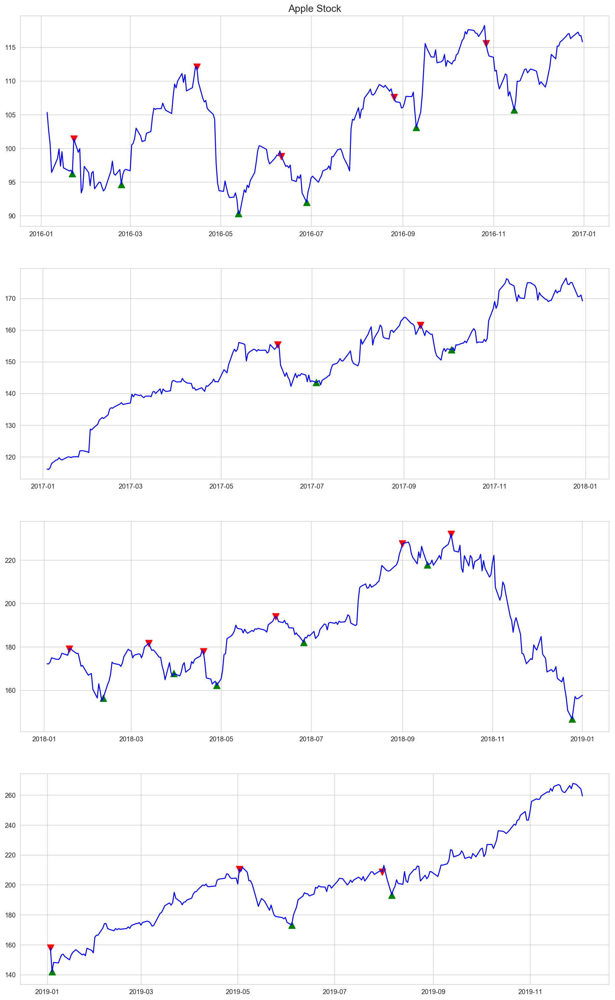

In [8]:
# Plot Graphs for Apple
fig, axes = plt.subplots(nrows=4, figsize=(16,27))
axes[0].set_title("Apple Stock", fontsize=15)
axes[0].plot(df_aapl['2016'].index, df_aapl['2016']['close_price'],c='b') # first plot
axes[0].scatter(df_aapl['2016'][df_aapl['reversal']==1].index, df_aapl['2016'][df_aapl['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[0].scatter(df_aapl['2016'][df_aapl['reversal']==2].index, df_aapl['2016'][df_aapl['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[1].plot(df_aapl['2017'].index,df_aapl['2017']['close_price'],c='b') # first plot
axes[1].scatter(df_aapl['2017'][df_aapl['reversal']==1].index, df_aapl['2017'][df_aapl['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[1].scatter(df_aapl['2017'][df_aapl['reversal']==2].index, df_aapl['2017'][df_aapl['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[2].plot(df_aapl['2018'].index,df_aapl['2018']['close_price'],c='b') # first plot
axes[2].scatter(df_aapl['2018'][df_aapl['reversal']==1].index, df_aapl['2018'][df_aapl['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[2].scatter(df_aapl['2018'][df_aapl['reversal']==2].index, df_aapl['2018'][df_aapl['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[3].plot(df_aapl['2019'].index,df_aapl['2019']['close_price'],c='b') # first plot
axes[3].scatter(df_aapl['2019'][df_aapl['reversal']==1].index, df_aapl['2019'][df_aapl['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[3].scatter(df_aapl['2019'][df_aapl['reversal']==2].index, df_aapl['2019'][df_aapl['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

## Facebook Stock

/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Boolean Series key w

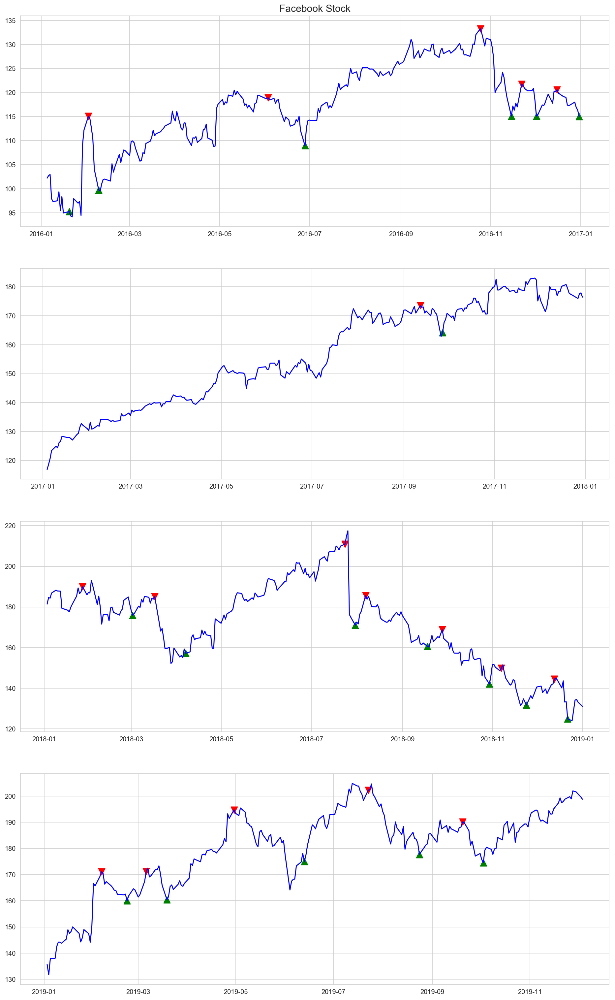

In [9]:
# Plot Graph for Facebook
fig, axes = plt.subplots(nrows=4, figsize=(16,27))
axes[0].set_title("Facebook Stock", fontsize=15)
axes[0].plot(df_fb['2016'].index,df_fb['2016']['close_price'],c='b') # first plot
axes[0].scatter(df_fb['2016'][df_fb['reversal']==1].index, df_fb['2016'][df_fb['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[0].scatter(df_fb['2016'][df_fb['reversal']==2].index, df_fb['2016'][df_fb['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[1].plot(df_fb['2017'].index,df_fb['2017']['close_price'],c='b') # first plot
axes[1].scatter(df_fb['2017'][df_fb['reversal']==1].index, df_fb['2017'][df_fb['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[1].scatter(df_fb['2017'][df_fb['reversal']==2].index, df_fb['2017'][df_fb['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[2].plot(df_fb['2018'].index,df_fb['2018']['close_price'],c='b') # first plot
axes[2].scatter(df_fb['2018'][df_fb['reversal']==1].index, df_fb['2018'][df_fb['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[2].scatter(df_fb['2018'][df_fb['reversal']==2].index, df_fb['2018'][df_fb['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[3].plot(df_fb['2019'].index,df_fb['2019']['close_price'],c='b') # first plot
axes[3].scatter(df_fb['2019'][df_fb['reversal']==1].index, df_fb['2019'][df_fb['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[3].scatter(df_fb['2019'][df_fb['reversal']==2].index, df_fb['2019'][df_fb['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

## CRM Stock

/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Boolean Series key w

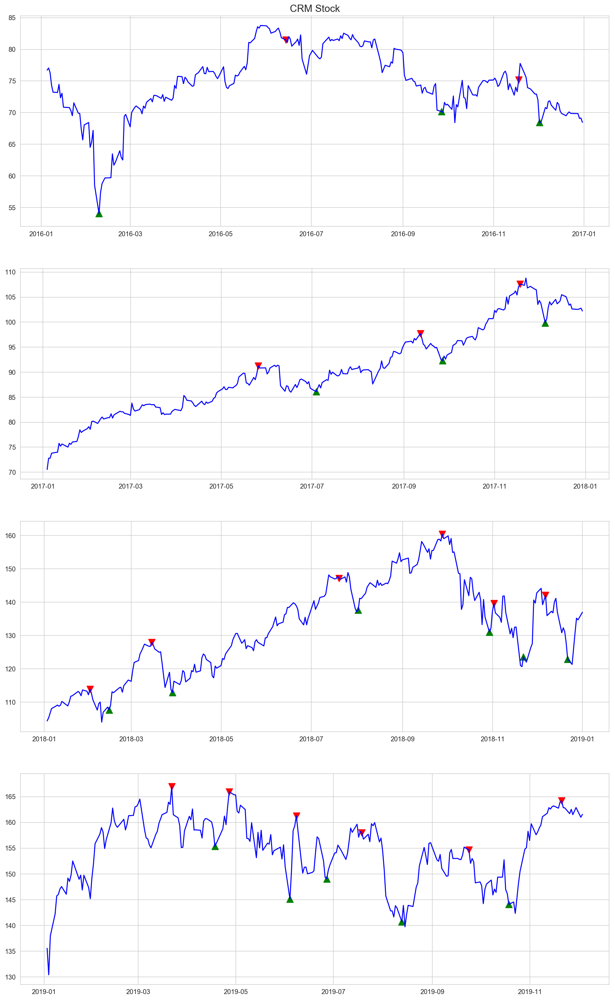

In [10]:
# Plot Graphs for CRM
fig, axes = plt.subplots(nrows=4, figsize=(16,27))
axes[0].set_title("CRM Stock", fontsize=15)
axes[0].plot(df_crm['2016'].index, df_crm['2016']['close_price'],c='b') # first plot
axes[0].scatter(df_crm['2016'][df_crm['reversal']==1].index, df_crm['2016'][df_crm['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[0].scatter(df_crm['2016'][df_crm['reversal']==2].index, df_crm['2016'][df_crm['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[1].plot(df_crm['2017'].index,df_crm['2017']['close_price'],c='b') # first plot
axes[1].scatter(df_crm['2017'][df_crm['reversal']==1].index, df_crm['2017'][df_crm['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[1].scatter(df_crm['2017'][df_crm['reversal']==2].index, df_crm['2017'][df_crm['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[2].plot(df_crm['2018'].index,df_crm['2018']['close_price'],c='b') # first plot
axes[2].scatter(df_crm['2018'][df_crm['reversal']==1].index, df_crm['2018'][df_crm['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[2].scatter(df_crm['2018'][df_crm['reversal']==2].index, df_crm['2018'][df_crm['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[3].plot(df_crm['2019'].index,df_crm['2019']['close_price'],c='b') # first plot
axes[3].scatter(df_crm['2019'][df_crm['reversal']==1].index, df_crm['2019'][df_crm['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[3].scatter(df_crm['2019'][df_crm['reversal']==2].index, df_crm['2019'][df_crm['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

## DIS Stock

/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Boolean Series key w

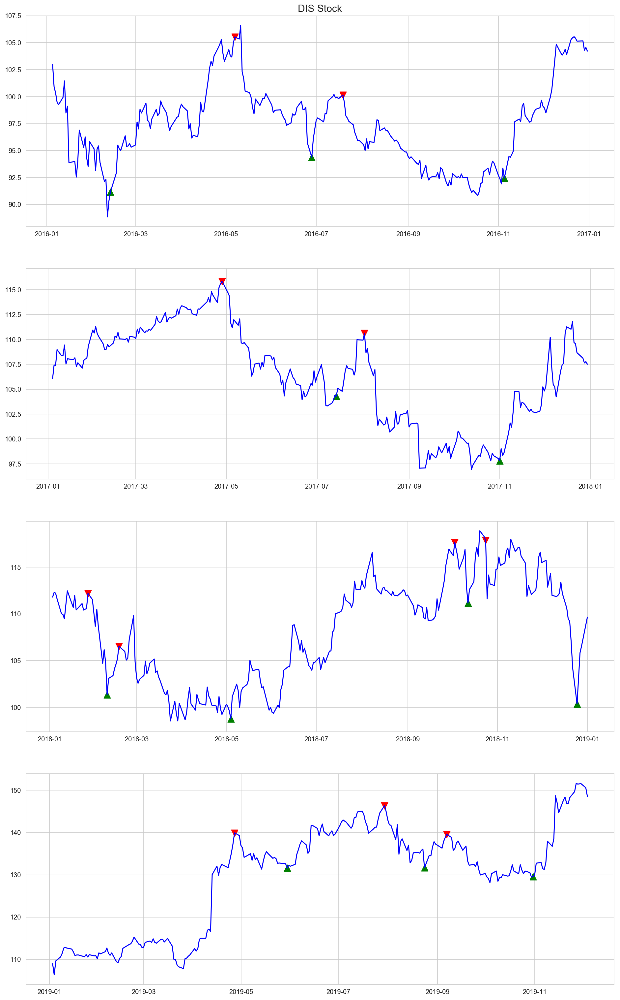

In [11]:
# Plot Graphs for DIS
fig, axes = plt.subplots(nrows=4, figsize=(16,27))
axes[0].set_title("DIS Stock", fontsize=15)
axes[0].plot(df_dis['2016'].index, df_dis['2016']['close_price'],c='b') # first plot
axes[0].scatter(df_dis['2016'][df_dis['reversal']==1].index, df_dis['2016'][df_dis['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[0].scatter(df_dis['2016'][df_dis['reversal']==2].index, df_dis['2016'][df_dis['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[1].plot(df_dis['2017'].index,df_dis['2017']['close_price'],c='b') # first plot
axes[1].scatter(df_dis['2017'][df_dis['reversal']==1].index, df_dis['2017'][df_dis['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[1].scatter(df_dis['2017'][df_dis['reversal']==2].index, df_dis['2017'][df_dis['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[2].plot(df_dis['2018'].index,df_dis['2018']['close_price'],c='b') # first plot
axes[2].scatter(df_dis['2018'][df_dis['reversal']==1].index, df_dis['2018'][df_dis['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[2].scatter(df_dis['2018'][df_dis['reversal']==2].index, df_dis['2018'][df_dis['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[3].plot(df_dis['2019'].index,df_dis['2019']['close_price'],c='b') # first plot
axes[3].scatter(df_dis['2019'][df_dis['reversal']==1].index, df_dis['2019'][df_dis['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[3].scatter(df_dis['2019'][df_dis['reversal']==2].index, df_dis['2019'][df_dis['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

## GM Stock

/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Boolean Series key w

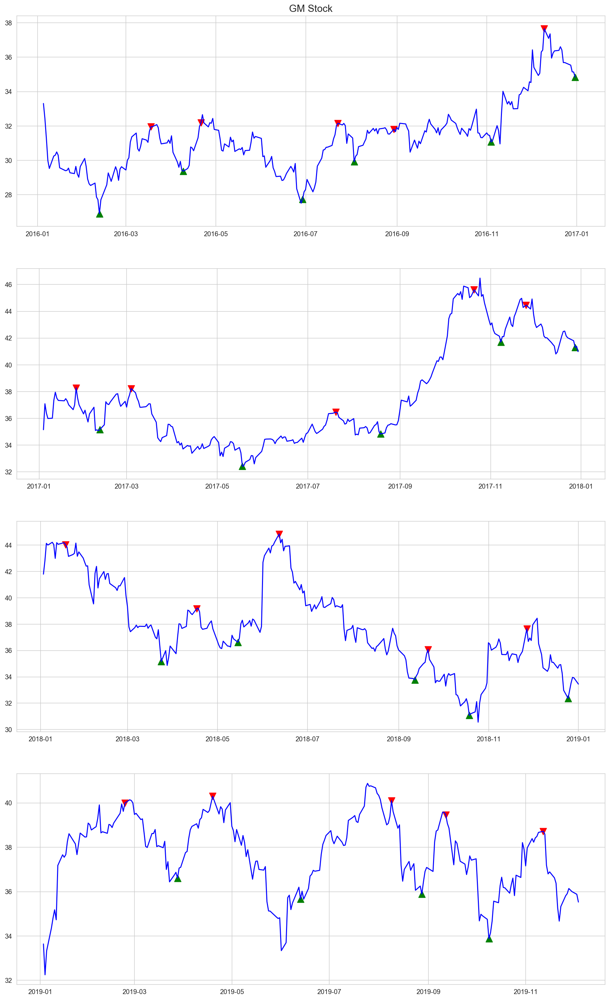

In [12]:
# Plot Graphs for GM
fig, axes = plt.subplots(nrows=4, figsize=(16,27))
axes[0].set_title("GM Stock", fontsize=15)
axes[0].plot(df_gm['2016'].index, df_gm['2016']['close_price'],c='b') # first plot
axes[0].scatter(df_gm['2016'][df_gm['reversal']==1].index, df_gm['2016'][df_gm['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[0].scatter(df_gm['2016'][df_gm['reversal']==2].index, df_gm['2016'][df_gm['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[1].plot(df_gm['2017'].index,df_gm['2017']['close_price'],c='b') # first plot
axes[1].scatter(df_gm['2017'][df_gm['reversal']==1].index, df_gm['2017'][df_gm['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[1].scatter(df_gm['2017'][df_gm['reversal']==2].index, df_gm['2017'][df_gm['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[2].plot(df_gm['2018'].index,df_gm['2018']['close_price'],c='b') # first plot
axes[2].scatter(df_gm['2018'][df_gm['reversal']==1].index, df_gm['2018'][df_gm['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[2].scatter(df_gm['2018'][df_gm['reversal']==2].index, df_gm['2018'][df_gm['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[3].plot(df_gm['2019'].index,df_gm['2019']['close_price'],c='b') # first plot
axes[3].scatter(df_gm['2019'][df_gm['reversal']==1].index, df_gm['2019'][df_gm['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[3].scatter(df_gm['2019'][df_gm['reversal']==2].index, df_gm['2019'][df_gm['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

## INTC Stock

/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Boolean Series key w

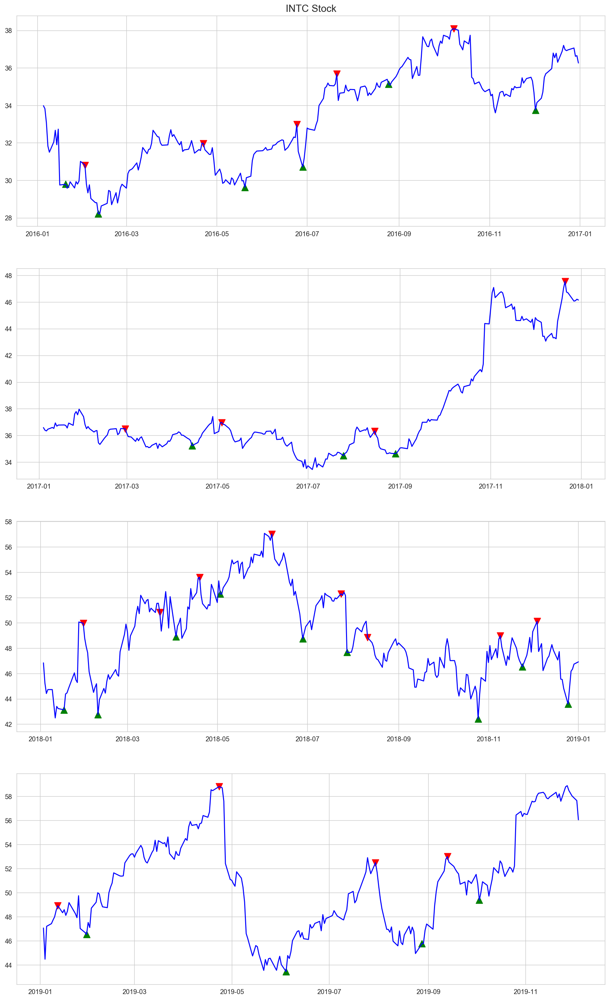

In [13]:
# Plot Graphs for intc
fig, axes = plt.subplots(nrows=4, figsize=(16,27))
axes[0].set_title("INTC Stock", fontsize=15)
axes[0].plot(df_intc['2016'].index, df_intc['2016']['close_price'],c='b') # first plot
axes[0].scatter(df_intc['2016'][df_intc['reversal']==1].index, df_intc['2016'][df_intc['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[0].scatter(df_intc['2016'][df_intc['reversal']==2].index, df_intc['2016'][df_intc['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[1].plot(df_intc['2017'].index,df_intc['2017']['close_price'],c='b') # first plot
axes[1].scatter(df_intc['2017'][df_intc['reversal']==1].index, df_intc['2017'][df_intc['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[1].scatter(df_intc['2017'][df_intc['reversal']==2].index, df_intc['2017'][df_intc['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[2].plot(df_intc['2018'].index,df_intc['2018']['close_price'],c='b') # first plot
axes[2].scatter(df_intc['2018'][df_intc['reversal']==1].index, df_intc['2018'][df_intc['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[2].scatter(df_intc['2018'][df_intc['reversal']==2].index, df_intc['2018'][df_intc['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[3].plot(df_intc['2019'].index,df_intc['2019']['close_price'],c='b') # first plot
axes[3].scatter(df_intc['2019'][df_intc['reversal']==1].index, df_intc['2019'][df_intc['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[3].scatter(df_intc['2019'][df_intc['reversal']==2].index, df_intc['2019'][df_intc['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

## NKE Stock

/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Boolean Series key w

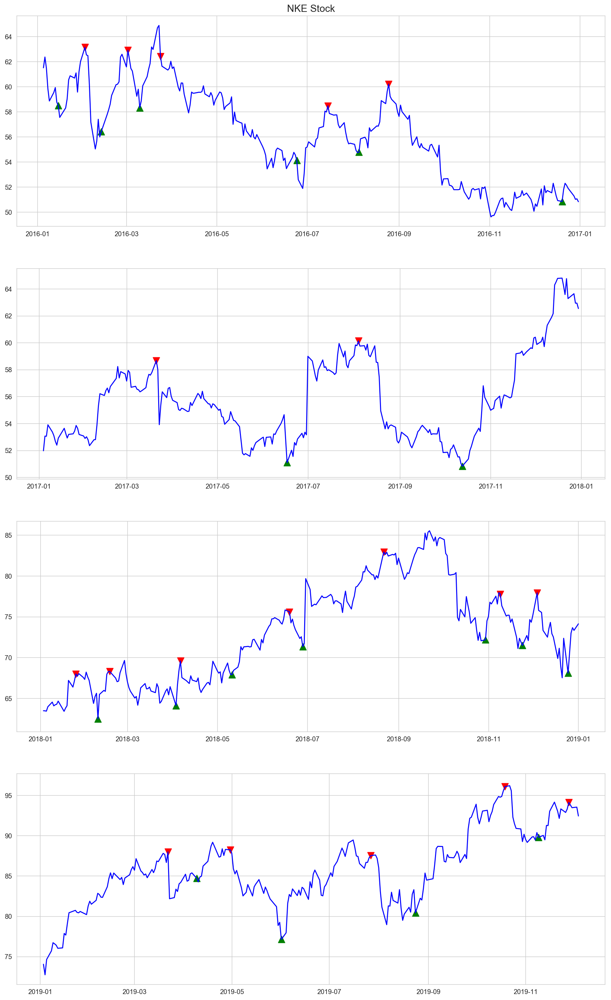

In [14]:
# Plot Graphs for nke
fig, axes = plt.subplots(nrows=4, figsize=(16,27))
axes[0].set_title("NKE Stock", fontsize=15)
axes[0].plot(df_nke['2016'].index, df_nke['2016']['close_price'],c='b') # first plot
axes[0].scatter(df_nke['2016'][df_nke['reversal']==1].index, df_nke['2016'][df_nke['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[0].scatter(df_nke['2016'][df_nke['reversal']==2].index, df_nke['2016'][df_nke['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[1].plot(df_nke['2017'].index,df_nke['2017']['close_price'],c='b') # first plot
axes[1].scatter(df_nke['2017'][df_nke['reversal']==1].index, df_nke['2017'][df_nke['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[1].scatter(df_nke['2017'][df_nke['reversal']==2].index, df_nke['2017'][df_nke['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[2].plot(df_nke['2018'].index,df_nke['2018']['close_price'],c='b') # first plot
axes[2].scatter(df_nke['2018'][df_nke['reversal']==1].index, df_nke['2018'][df_nke['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[2].scatter(df_nke['2018'][df_nke['reversal']==2].index, df_nke['2018'][df_nke['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[3].plot(df_nke['2019'].index,df_nke['2019']['close_price'],c='b') # first plot
axes[3].scatter(df_nke['2019'][df_nke['reversal']==1].index, df_nke['2019'][df_nke['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[3].scatter(df_nke['2019'][df_nke['reversal']==2].index, df_nke['2019'][df_nke['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

## TRIP Stock

/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Boolean Series key w

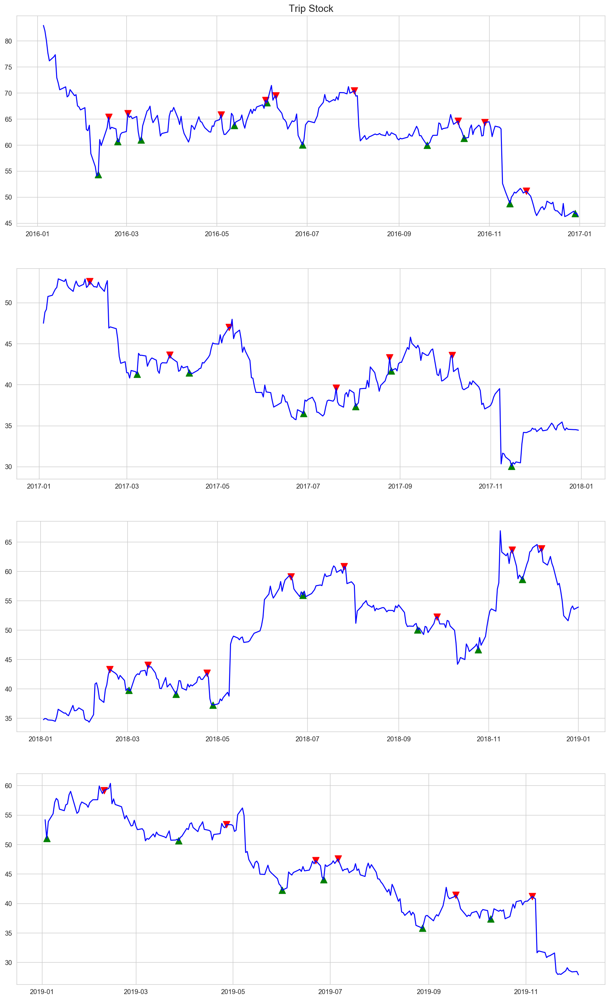

In [15]:
# Plot Graphs for trip
fig, axes = plt.subplots(nrows=4, figsize=(16,27))
axes[0].set_title("Trip Stock", fontsize=15)
axes[0].plot(df_trip['2016'].index, df_trip['2016']['close_price'],c='b') # first plot
axes[0].scatter(df_trip['2016'][df_trip['reversal']==1].index, df_trip['2016'][df_trip['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[0].scatter(df_trip['2016'][df_trip['reversal']==2].index, df_trip['2016'][df_trip['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[1].plot(df_trip['2017'].index,df_trip['2017']['close_price'],c='b') # first plot
axes[1].scatter(df_trip['2017'][df_trip['reversal']==1].index, df_trip['2017'][df_trip['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[1].scatter(df_trip['2017'][df_trip['reversal']==2].index, df_trip['2017'][df_trip['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[2].plot(df_trip['2018'].index,df_trip['2018']['close_price'],c='b') # first plot
axes[2].scatter(df_trip['2018'][df_trip['reversal']==1].index, df_trip['2018'][df_trip['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[2].scatter(df_trip['2018'][df_trip['reversal']==2].index, df_trip['2018'][df_trip['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[3].plot(df_trip['2019'].index,df_trip['2019']['close_price'],c='b') # first plot
axes[3].scatter(df_trip['2019'][df_trip['reversal']==1].index, df_trip['2019'][df_trip['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[3].scatter(df_trip['2019'][df_trip['reversal']==2].index, df_trip['2019'][df_trip['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

## TWTR Stock

/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Boolean Series key w

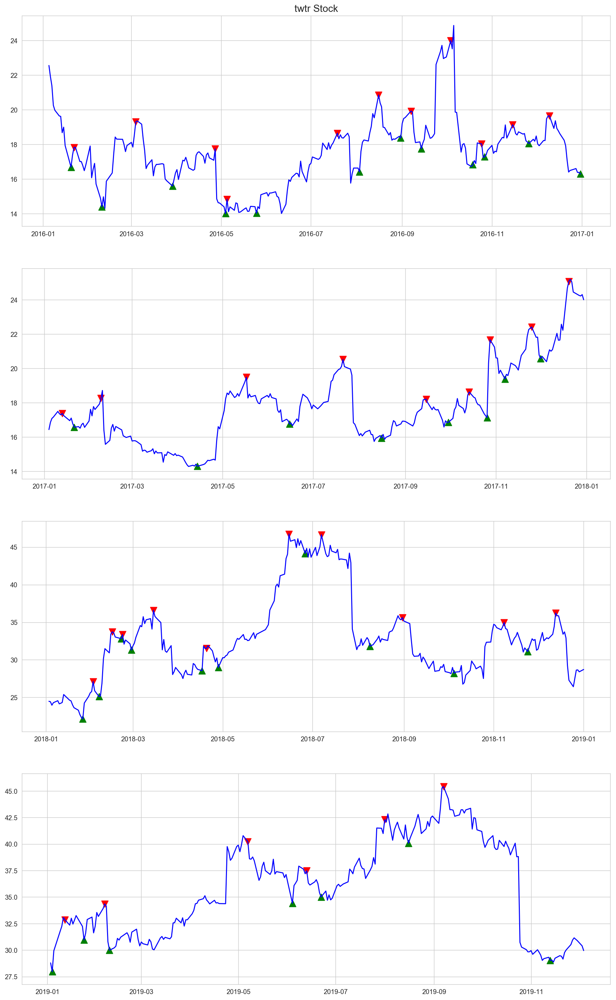

In [16]:
# Plot Graphs for twtr
fig, axes = plt.subplots(nrows=4, figsize=(16,27))
axes[0].set_title("twtr Stock", fontsize=15)
axes[0].plot(df_twtr['2016'].index, df_twtr['2016']['close_price'],c='b') # first plot
axes[0].scatter(df_twtr['2016'][df_twtr['reversal']==1].index, df_twtr['2016'][df_twtr['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[0].scatter(df_twtr['2016'][df_twtr['reversal']==2].index, df_twtr['2016'][df_twtr['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[1].plot(df_twtr['2017'].index,df_twtr['2017']['close_price'],c='b') # first plot
axes[1].scatter(df_twtr['2017'][df_twtr['reversal']==1].index, df_twtr['2017'][df_twtr['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[1].scatter(df_twtr['2017'][df_twtr['reversal']==2].index, df_twtr['2017'][df_twtr['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[2].plot(df_twtr['2018'].index,df_twtr['2018']['close_price'],c='b') # first plot
axes[2].scatter(df_twtr['2018'][df_twtr['reversal']==1].index, df_twtr['2018'][df_twtr['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[2].scatter(df_twtr['2018'][df_twtr['reversal']==2].index, df_twtr['2018'][df_twtr['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[3].plot(df_twtr['2019'].index,df_twtr['2019']['close_price'],c='b') # first plot
axes[3].scatter(df_twtr['2019'][df_twtr['reversal']==1].index, df_twtr['2019'][df_twtr['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[3].scatter(df_twtr['2019'][df_twtr['reversal']==2].index, df_twtr['2019'][df_twtr['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

## V Stock

/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Boolean Series key w

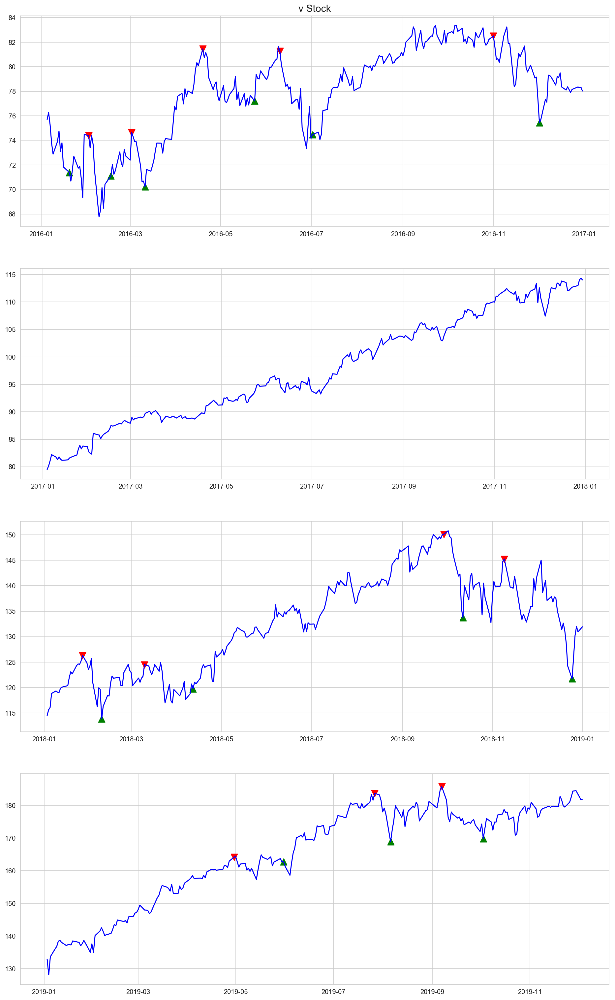

In [17]:
# Plot Graphs for v
fig, axes = plt.subplots(nrows=4, figsize=(16,27))
axes[0].set_title("v Stock", fontsize=15)
axes[0].plot(df_v['2016'].index, df_v['2016']['close_price'],c='b') # first plot
axes[0].scatter(df_v['2016'][df_v['reversal']==1].index, df_v['2016'][df_v['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[0].scatter(df_v['2016'][df_v['reversal']==2].index, df_v['2016'][df_v['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[1].plot(df_v['2017'].index,df_v['2017']['close_price'],c='b') # first plot
axes[1].scatter(df_v['2017'][df_v['reversal']==1].index, df_v['2017'][df_v['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[1].scatter(df_v['2017'][df_v['reversal']==2].index, df_v['2017'][df_v['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[2].plot(df_v['2018'].index,df_v['2018']['close_price'],c='b') # first plot
axes[2].scatter(df_v['2018'][df_v['reversal']==1].index, df_v['2018'][df_v['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[2].scatter(df_v['2018'][df_v['reversal']==2].index, df_v['2018'][df_v['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

axes[3].plot(df_v['2019'].index,df_v['2019']['close_price'],c='b') # first plot
axes[3].scatter(df_v['2019'][df_v['reversal']==1].index, df_v['2019'][df_v['reversal']==1]['close_price'], marker = '^', c='g', s = 100)
axes[3].scatter(df_v['2019'][df_v['reversal']==2].index, df_v['2019'][df_v['reversal']==2]['close_price'], marker = 'v', c='r', s = 100)

From the Graphs above, each cell represents 1 year worth of data on, 2016, 2017, 2018 and 2019. There are 5 plots in each cell which represent each trading year.

The graphs shows the a time series line plot for the closing price of all the Stocks. As you can see, each day there are some pretty heavy price fluctuations. So the question comes, when should we actually go and buy/sell into the stock?

As you can see from the plots, at some points in the plots, there is a red down arrow or a green up arrow. They might look like random marks in the graph, but there is meaning for the markers. Each of the markers is our target variable and they represent the best time to sell or buy into the stock being examined.

The red down arrow represents the optimum point in time to sell/short the stock.

The green arrow represents the optimum point to buy/long the stock.

## Checking for Stationarity

Why is it important to check and make sure our data is stationary?

In the most intuitive sense, stationarity means that the statistical properties of a process generating a time series do not change over time.

The full details to answer this question can be found in this [website](https://towardsdatascience.com/stationarity-in-time-series-analysis-90c94f27322).

But in short, these are the reasons why it is important to make time series data staionary.

- Stationary processes are easier to analyze
- stationarity’s importance is its ubiquity in time series analysis, making the ability to understand, detect and model it necessary for the application of many prominent tools and procedures in time series analysis

There are 3 types of Stationarity: [website](https://www.analyticsvidhya.com/blog/2018/09/non-stationary-time-series-python/)

- Strict Stationary: A strict stationary series satisfies the mathematical definition of a stationary process. For a strict stationary series, the mean, variance and covariance are not the function of time. The aim is to convert a non-stationary series into a strict stationary series for making predictions.
- Trend Stationary: A series that has no unit root but exhibits a trend is referred to as a trend stationary series. Once the trend is removed, the resulting series will be strict stationary. The KPSS test classifies a series as stationary on the absence of unit root. This means that the series can be strict stationary or trend stationary.
- Difference Stationary: A time series that can be made strict stationary by differencing falls under difference stationary. ADF test is also known as a difference stationarity test.

### Further Cleaning before Analysis

For this section, we will only be using the close_price column to check for stationarity.

In [18]:
# New DataFrame with only local_time, close_price and stock name

df_eda = df[['stock', 'local_time', 'close_price']].copy()
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10060 entries, 0 to 10059
Data columns (total 3 columns):
stock          10060 non-null object
local_time     10060 non-null datetime64[ns]
close_price    10060 non-null float64
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 235.9+ KB


In [19]:
# Change Local_time datatype to Datetime
df_eda['local_time'] = pd.to_datetime(df_eda['local_time'])
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10060 entries, 0 to 10059
Data columns (total 3 columns):
stock          10060 non-null object
local_time     10060 non-null datetime64[ns]
close_price    10060 non-null float64
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 235.9+ KB


In [20]:
# Create a Table with datetime as index, Stock Ticker as Columns and Stock price as values
df_eda_pivot = pd.pivot_table(df_eda, index = 'local_time', columns = 'stock', values = 'close_price')
# DataFrame that will be used for feature engineering
df_eda_fe = pd.pivot_table(df_eda, index = 'local_time', columns = 'stock', values = 'close_price')

There are various Null Values before the stocks data with null values were scrapped at a later time than the others.

There is a limit to scrape 2 months only, hence we cannot get any data before that.

In [21]:
# Drop Observations with Null Values
df_eda_pivot.dropna(inplace= True)
df_eda_pivot.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1006 entries, 2015-12-04 22:30:00 to 2019-12-03 22:30:00
Data columns (total 10 columns):
AAPL    1006 non-null float64
CRM     1006 non-null float64
DIS     1006 non-null float64
FB      1006 non-null float64
GM      1006 non-null float64
INTC    1006 non-null float64
NKE     1006 non-null float64
TRIP    1006 non-null float64
TWTR    1006 non-null float64
V       1006 non-null float64
dtypes: float64(10)
memory usage: 86.5 KB


### Time Series Plots

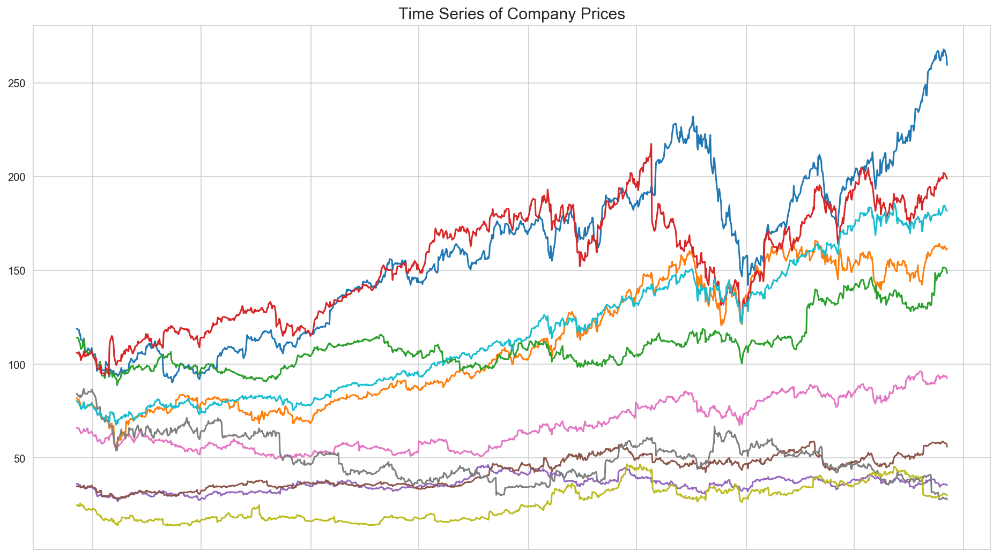

In [22]:
# Plot Basic Line Graph of all the companies 
fig, axes = plt.subplots(figsize=(16,9))
plt.title('Time Series of Company Prices', fontsize = 15)
plt.plot(df_eda_pivot)
plt.tick_params(axis='x',
               which = 'both',
               bottom = False,
               top = False,
               labelbottom = False)

What’s wrong with this chart?

While absolute price is important, when trading, we are more concerned about the relative change of an asset rather than its absolute price. Google’s stocks (Blue) are much more expensive than all the others in our dataset, and this difference makes all the stocks stocks appear much less volatile than they truly are (that is, their price appears to not deviate much). We could not see any trends for this plot.

The solution would be to use different scales when plotting the data.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x13836f7b8>],
      dtype=object)

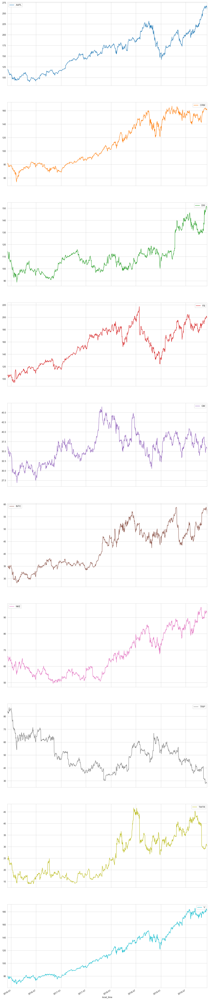

In [23]:
# Separated Each company into their own plots
df_eda_pivot.plot(subplots= True, layout = (-1,1), figsize =(16, 9*len(df_eda_pivot.columns)))

From the plot above, we can see that all of the companies are Non-Stationary. For it to be stationary, the mean would have to be constant.

This condition is already broken as we can see that each company's mean is either increasing over time or decreasing over time.

Next we look at constant variance. We cant exactly tell from the graph so we will go to the second step to determine stationarity.

### Statistical Tests

#### ADF (Augmented Dickey Fuller) Test

It can be used to determine the presence of unit root in the series, and hence help us understand if the series is stationary or not. The null and alternate hypothesis of this test are:

- Null Hypothesis: The series has a unit root (value of a =1). Non-Stationary

- Alternate Hypothesis: The series has no unit root. Stationary

If we fail to reject the null hypothesis, we can say that the series is non-stationary. This means that the series can be linear or difference stationary

In [24]:
# ADF Test
adf_test(df_eda_pivot, df_eda_pivot.columns )

ADF Statistic for AAPL: -0.17336167360079732
p-value for AAPL: 0.9416232414164956
Critial Values:
   1%, -3.4369325637409154
Critial Values:
   5%, -2.8644462162311934
Critial Values:
   10%, -2.568317409920808
P-Value is more than 0.05, Null Hypothesis cannot be Rejected. Hence, AAPL is not Stationary.
----------------------------------------
ADF Statistic for CRM: -0.22479743512523073
p-value for CRM: 0.9355005559710168
Critial Values:
   1%, -3.4370062675076807
Critial Values:
   5%, -2.8644787205542492
Critial Values:
   10%, -2.568334722615888
P-Value is more than 0.05, Null Hypothesis cannot be Rejected. Hence, CRM is not Stationary.
----------------------------------------
ADF Statistic for DIS: -0.32422481192446445
p-value for DIS: 0.9220026096145305
Critial Values:
   1%, -3.436893045520188
Critial Values:
   5%, -2.8644287878535146
Critial Values:
   10%, -2.568308127138936
P-Value is more than 0.05, Null Hypothesis cannot be Rejected. Hence, DIS is not Stationary.
----------

From the ADF Test performed. We now know that none of the companies are Stationary. We can turn the time series stationary by differencing.

#### KPSS (Kwiatkowski-Phillips-Schmidt-Shin) Test

KPSS is used to determine if the time series is trend stationary or not.
The null and alternate hypothesis of this test are:

Null Hypothesis: The series is trend Stationary

Alternate Hypothesis: The series is not Stationary.

If we reject the null hypothesis, we can say that the series is non-stationary. This means that the series can be trend stationary.

In [25]:
# ADF Test
kpss_test(df_eda_pivot, df_eda_pivot.columns)

KPSS Statistic for AAPL: 3.902079147501206
p-value for AAPL: 0.01
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739
P-Value is less than 0.05, Null Hypothesis is Rejected. AAPL is not Stationary.
----------------------------------------
KPSS Statistic for CRM: 4.2778418301087875
p-value for CRM: 0.01
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739
P-Value is less than 0.05, Null Hypothesis is Rejected. CRM is not Stationary.
----------------------------------------
KPSS Statistic for DIS: 2.88775912979528
p-value for DIS: 0.01
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739
P-Value is less than 0.05, Null Hypothesis is Rejected. DIS is not Stationary.
----------------------------------------
KPSS Statistic for FB: 3.2094518965107968
p-value for FB: 0.01
Critial Values:
   10%, 0

/Users/edwinotw/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1685: FutureWarning: The behavior of using lags=None will change in the next release. Currently lags=None is the same as lags='legacy', and so a sample-size lag length is used. After the next release, the default will change to be the same as lags='auto' which uses an automatic lag length selection method. To silence this warning, either use 'auto' or 'legacy'
  warn(msg, FutureWarning)
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/sta

From the KPSS Test performed. We now know that none of the companies are Stationary.

# Feature Engineering

Now that EDA is completed, I will convert all labels respectively.

Following that, I will create features to make the time series data both trend stationary and difference stationary.

Also, I will create some basic Financial Analysis features such as, %change/log %change, log Returns and Volatility.

Lastly, I will create features for Technical Indicators.

## Convert all (1) and (2) Labels to (1)
**(1) will represent all Reversal Points Regardless of buying or selling point**

To identify if it is a selling point, ['reversal'] column = 1 and ['gain'] column = 1

To identify if it is a buying point, ['reversal'] column = 1 and ['gain'] column = -1

### Convert Reversal Labels

In [26]:
# Replace 2 with 1 in the reversal Column
df['reversal'].replace(2,1,inplace = True)

In [27]:
# Check Baseline Accuracy
df['reversal'].value_counts(normalize=True)

0    0.959245
1    0.040755
Name: reversal, dtype: float64

## Creating Features to make Time Series Stationary

To make a time series difference stationary, We can take the difference of consecutive prices. This is to remove the varying mean.
Another way is to take the %change.

### Taking Difference

In [28]:
# Taking Difference
df_diff = df_eda_pivot.diff().fillna(0)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x13aa91630>],
      dtype=object)

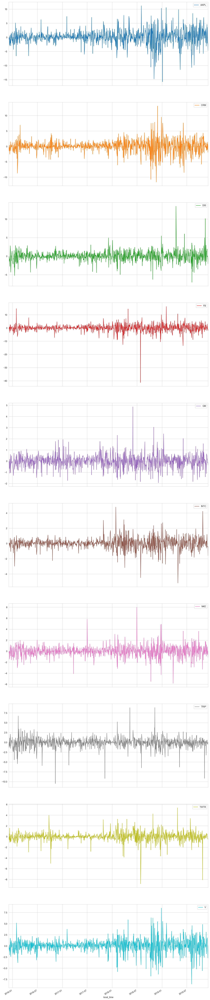

In [29]:
# Plot to check for stationary
df_diff.plot(subplots= True, layout = (-1,1), figsize =(16, 9*len(df_diff.columns)))

The plot shows that the mean is now stationary around 0, however the variance does not seem constant yet. To make the variance constant, I will do a log transform of the difference values. 

In [30]:
# Log Transform the difference 
df_logdiff = np.log(df_eda_pivot).diff().fillna(0)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x12a60b780>],
      dtype=object)

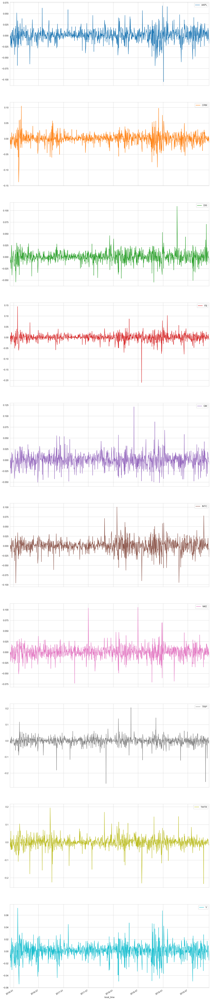

In [31]:
# Plot to check for constant Variance
df_logdiff.plot(subplots= True, layout = (-1,1), figsize =(16, 9*len(df_logdiff.columns)))

It would seem that the log graphs looks exactly the same as the graphs without log transform. This means that without log transformation, df_diff already has constant variance and mean. Hence, we do not need to log transform the difference.

### Taking % Change in Price

In [32]:
# Taking % Change
df_pct = df_eda_pivot.pct_change().fillna(0)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1276896d8>],
      dtype=object)

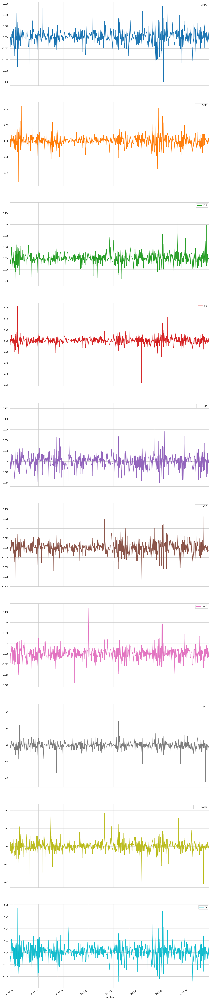

In [33]:
# Plot pct_change
df_pct.plot(subplots= True, layout = (-1,1), figsize =(16, 9*len(df_pct.columns)))

From the graph, we can see that the it looks exactly the same as the graph on the log difference transformation. If we look at the actual values on the respective tables, I noticed that the values are nearly identical.

This tells me that log difference transformation is actually the %Change in prices.

Next, I will perform log transformation on %Change to see if there is any change.

In [34]:
# Log Transform the Pct_Change 
df_logpct = np.log(df_eda_pivot).pct_change().fillna(0)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x140e50d30>],
      dtype=object)

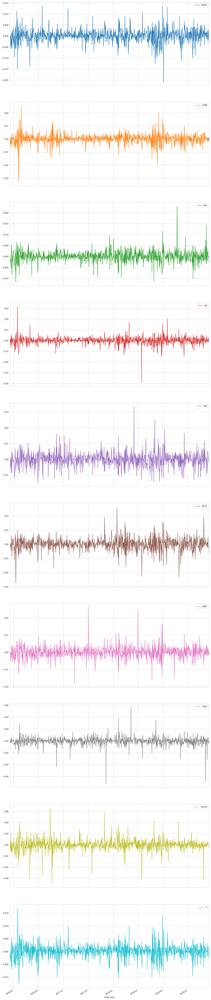

In [35]:
# Plot log pct_change
df_logpct.plot(subplots= True, layout = (-1,1), figsize =(16, 9*len(df_logpct.columns)))

From the graph, there is no difference in the graph from the previous 3 graphs plotted. Since there are no difference in any of them. I will choose use 1 of the dataframe as the feature instead of all of them, to avoid multicollinearity.

I will use Pct_Change as my feature.

In [36]:
# Create Feature
df_pct_fe = df_eda_fe.pct_change().fillna(0)

In [37]:
# Melting Pct_Change in to 1 column to merge with main df
df_pct_melted = pd.melt(df_pct_fe.reset_index(), id_vars='local_time').rename(columns={'value': 'pct_change'})

### Returns

Another feature that we can consider is the Stock returns. Investors are usually interested in stock returns as it can be used to compare between different companies. 

In [38]:
# Calculating Returns
df_return = df_eda_pivot.apply(lambda x : (x/x[0])-1)

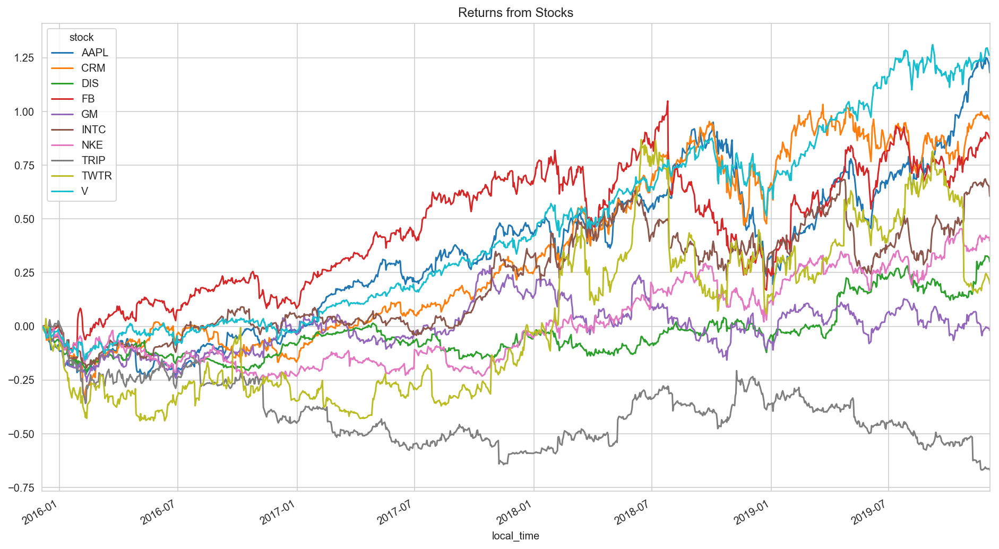

In [39]:
# Plotting the returns from stocks
df_return.plot(figsize=(16,9),title ="Returns from Stocks")

The plot above shows how profitable each stock is for the past 4 years. We can see most of the company's gain/loss from 20% to 100%. 

Only 1 companies had a major drop of 50%, TRIP.

Generally all the stock have some percentage of returns over 4 years, except the stock mentioned above

In [40]:
# Create Return Feature
df_return_fe = df_eda_fe.apply(lambda x : (x/x[0])-1)
df_return_fe = df_return_fe[['AAPL','FB']] # Use these columns as they have full data
df_return.drop(columns =['AAPL','FB'], inplace=True) # Drop these columns before merging to prevent duplication

In [41]:
# Merge to Create final Return DataFrame to merge into main dataframe
df_return_fe = df_return_fe.merge(df_return, on = 'local_time', how = 'left')

In [42]:
# Melting Returns in to 1 column to merge with main df
df_return_melted = pd.melt(df_return_fe.reset_index(), id_vars='local_time').rename(columns={'value': 'return'})

### Volatility

The volatility of a stock is a measurement of the change in variance in the returns of a stock over a specific period of time.

Generally, the higher the volatility, the riskier the investment in that stock, which results in investing in one over another.

The period we will be looking at is 1 trading day = 78 periods
((6hrs * 60) + 30mins)/5)

In [43]:
# Define Minimum periods
period = 60

# Calculate Volatility
df_vol = df_pct.rolling(period).std() * np.sqrt(period)

# Fill Null Values with median
df_vol = df_vol.fillna(df_vol.median())

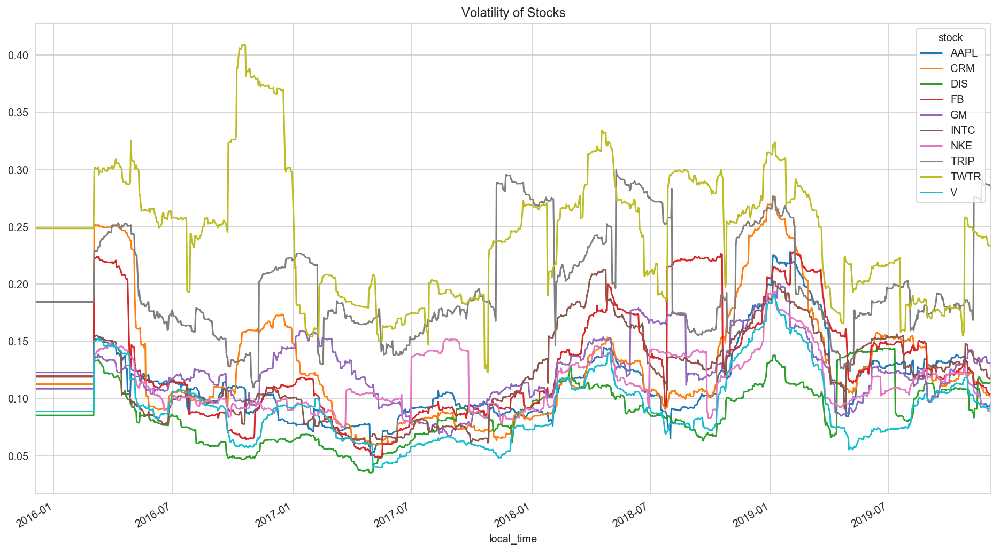

In [44]:
# Plot Volatility
df_vol.plot(figsize=(16,9),title ="Volatility of Stocks")

The volatility of the various stock are pretty stable around 0.05 to 0.20. Execpt for the 2 companies where volatility is constantly above 0.20 by TWTR and TRIP. 

In [45]:
# Create Feature
# Calculate Volatility
df_vol_fe = df_pct_fe.rolling(period).std() * np.sqrt(period)

# Fill Null Values with median
df_vol_fe = df_vol_fe.fillna(df_vol.median())

In [46]:
# Melting Returns in to 1 column to merge with main df
df_vol_melted = pd.melt(df_vol_fe.reset_index(), id_vars='local_time').rename(columns={'value': 'volatility'})

### Merge Created DataFrames with Main DataFrame

In [47]:
# Merge all feature DataFrames into Main DataFrame
df = df.merge(df_pct_melted, how = 'left', on = ['local_time', 'stock'])
df = df.merge(df_return_melted, how = 'left', on = ['local_time', 'stock'])
df = df.merge(df_vol_melted, how = 'left', on = ['local_time', 'stock'])
df.shape

(10060, 13)

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10060 entries, 0 to 10059
Data columns (total 13 columns):
stock            10060 non-null object
time             10060 non-null int64
local_time       10060 non-null datetime64[ns]
open_price       10060 non-null float64
close_price      10060 non-null float64
highest_price    10060 non-null float64
lowest_price     10060 non-null float64
volume           10060 non-null int64
gain             10060 non-null int64
reversal         10060 non-null int64
pct_change       10060 non-null float64
return           10060 non-null float64
volatility       10060 non-null float64
dtypes: datetime64[ns](1), float64(7), int64(4), object(1)
memory usage: 1.1+ MB


In [49]:
# Fill Null Values with the preceding values as return would be around the same in that period of time
df = df.fillna(method='ffill')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10060 entries, 0 to 10059
Data columns (total 13 columns):
stock            10060 non-null object
time             10060 non-null int64
local_time       10060 non-null datetime64[ns]
open_price       10060 non-null float64
close_price      10060 non-null float64
highest_price    10060 non-null float64
lowest_price     10060 non-null float64
volume           10060 non-null int64
gain             10060 non-null int64
reversal         10060 non-null int64
pct_change       10060 non-null float64
return           10060 non-null float64
volatility       10060 non-null float64
dtypes: datetime64[ns](1), float64(7), int64(4), object(1)
memory usage: 1.1+ MB


## Technical Indicator Features

In [50]:
# Add all Technical Indicators from the TA Library
df_ta = ta.add_all_ta_features(df = df, open = 'open_price', high = 'highest_price', low = 'lowest_price', close = 'close_price', volume = 'volume', fillna = True)

/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ta/trend.py:468: RuntimeWarning: invalid value encountered in double_scalars
  dip[i] = 100 * (self._dip[i]/self._trs[i])
/Users/edwinotw/anaconda3/lib/python3.7/site-packages/ta/trend.py:472: RuntimeWarning: invalid value encountered in double_scalars
  din[i] = 100 * (self._din[i]/self._trs[i])


In [51]:
# Check how many features were created
df_ta.shape

(10060, 74)

In [52]:
# Create EMA 3/5/7 Step
df_ta['ema3'] = ta.trend.ema_indicator(df_ta['close_price'], n = 3, fillna = True)
df_ta['ema5'] = ta.trend.ema_indicator(df_ta['close_price'], n = 5, fillna = True)
df_ta['ema7'] = ta.trend.ema_indicator(df_ta['close_price'], n = 7, fillna = True)
df_ta.shape

(10060, 77)

In [53]:
# Create SMA 3/5/7 Step
df_ta['sma3'] = df['close_price'].rolling(3).mean().fillna(method = 'bfill')
df_ta['sma5'] = df['close_price'].rolling(5).mean().fillna(method = 'bfill')
df_ta['sma7'] = df['close_price'].rolling(7).mean().fillna(method = 'bfill')
df_ta.shape

(10060, 80)

## Save Final DataSet to CSV

I will be creating a seperate Notebook to create shifted DataFrame columns for Machine Learning.

In [54]:
df_ta.to_csv('../datasets/features_data.csv', index = False)